**Omer Kamal Ali Ebead**

# Problem 1



# Preprocessing


*   Convert cifar-10 y labels to one hot vector so it can match the softmax output
*   Normalising cifar-10 x images by dividing them by 255.0

*   Try different architectures







In [ ]:
import keras
import tensorflow as tf
from keras import Sequential
from keras.layers import Conv2D,MaxPooling2D,Flatten,Dense,Dropout,GlobalAveragePooling2D,AvgPool2D,BatchNormalization
from keras.utils import to_categorical
from keras.datasets import cifar10
from keras.optimizers import Adam
import matplotlib.pyplot as plt
import numpy as np
import math
from PIL import Image
from google.colab.patches import cv2_imshow
import cv2
import requests
import shutil
import seaborn as sns

In [ ]:
(X_train,Y_train) , (X_test,Y_test) = cifar10.load_data()
play_Y_train = Y_train
play_Y_train = to_categorical(Y_train,10)
input_shape = X_train[0].shape
play_xtrain = X_train / 255.0


170498071/170498071 [==============================] - 2s 0us/step


In [ ]:
norm_x_test = X_test / 255.0
norm_y_test = to_categorical(Y_test,10)

# Simple Archtecture
* Around 55% validation accuracy.
* I needed to add more regularisation to the model and maybe make it more complex so the accuracy went higher.


In [ ]:
model = Sequential([

  Conv2D(filters=4 , kernel_size=(3,3),input_shape=input_shape,activation="relu",padding='same'),
  AvgPool2D(pool_size=(2,2)),

  Conv2D(filters=8 , kernel_size=(4,4),activation="relu",padding='same'),
  AvgPool2D(pool_size=(2,2)),


  Conv2D(filters=16 , kernel_size=(4,4),activation="relu",padding='same'),
  AvgPool2D(pool_size=(2,2)),


  Conv2D(filters=32 , kernel_size=(4,4),activation="relu",padding='same'),
  AvgPool2D(pool_size=(2,2)),



  Flatten(),
  Dense(256,activation='relu'),
  Dense(128,activation='relu'),
  Dense(64,activation='relu'),
  Dense(10,activation='softmax'),
])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 4)         112       
                                                                 
 average_pooling2d (Average  (None, 16, 16, 4)         0         
 Pooling2D)                                                      
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 8)         520       
                                                                 
 average_pooling2d_1 (Avera  (None, 8, 8, 8)           0         
 gePooling2D)                                                    
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 16)          2064      
                                                                 
 average_pooling2d_2 (Avera  (None, 4, 4, 16)          0

In [ ]:
opt = Adam()
model.compile(loss='categorical_crossentropy',optimizer=opt, metrics=['accuracy','categorical_accuracy'])
history_1 = model.fit(play_xtrain,play_Y_train,batch_size=128,epochs=20,validation_split=0.3)

Epoch 1/20
274/274 [==============================] - 6s 18ms/step - loss: 2.0296 - accuracy: 0.2362 - categorical_accuracy: 0.2362 - val_loss: 1.8269 - val_accuracy: 0.3157 - val_categorical_accuracy: 0.3157
Epoch 2/20
274/274 [==============================] - 4s 14ms/step - loss: 1.7577 - accuracy: 0.3426 - categorical_accuracy: 0.3426 - val_loss: 1.6963 - val_accuracy: 0.3751 - val_categorical_accuracy: 0.3751
Epoch 3/20
274/274 [==============================] - 4s 14ms/step - loss: 1.6681 - accuracy: 0.3799 - categorical_accuracy: 0.3799 - val_loss: 1.7062 - val_accuracy: 0.3592 - val_categorical_accuracy: 0.3592
Epoch 4/20
274/274 [==============================] - 4s 14ms/step - loss: 1.6039 - accuracy: 0.4039 - categorical_accuracy: 0.4039 - val_loss: 1.5685 - val_accuracy: 0.4249 - val_categorical_accuracy: 0.4249
Epoch 5/20
274/274 [==============================] - 4s 14ms/step - loss: 1.5440 - accuracy: 0.4323 - categorical_accuracy: 0.4323 - val_loss: 1.5823 - val_accurac

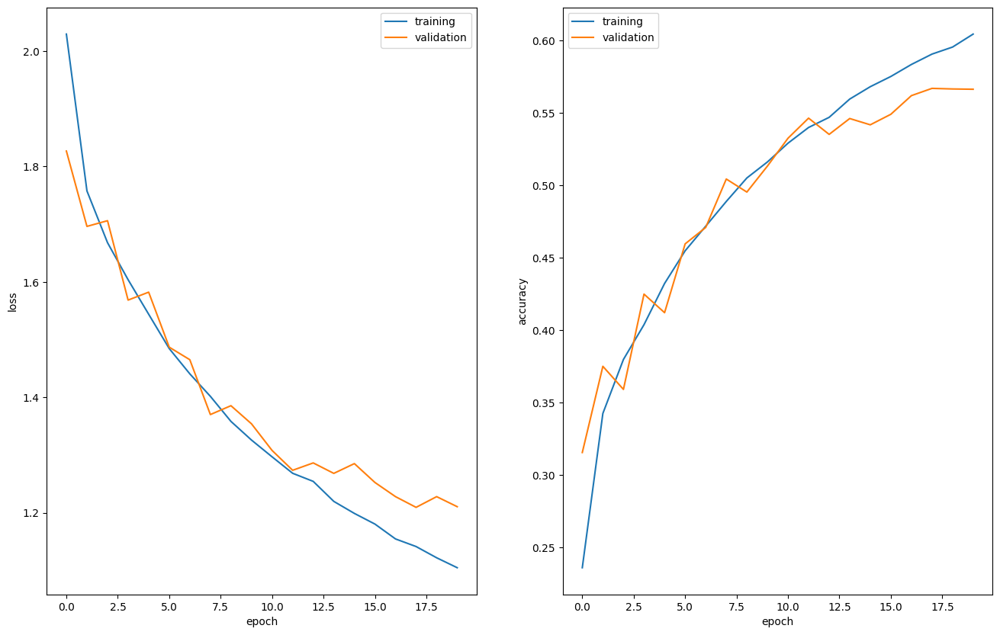

In [ ]:
h = history_1.history
plt.figure(1, figsize=(16, 10))

plt.subplot(121)
plt.xlabel('epoch')
plt.ylabel('loss')
plt.plot(h['loss'], label='training')
plt.plot(h['val_loss'], label='validation')
plt.legend()

plt.subplot(122)
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.plot(h['accuracy'], label='training')
plt.plot(h['val_accuracy'], label='validation')
plt.legend()

plt.show()

In [ ]:
# results = model.evaluate(norm_x_test, norm_y_test, batch_size=128)


79/79 [==============================] - 0s 5ms/step - loss: 1.6371 - accuracy: 0.6007 - categorical_accuracy: 0.6007


# Add Dropout and increase the number of Layers
* Around 65% validation accuracy.
* Training and validation losses were decreasing until a point where it seems that the model is overfitting (7.5 epoch). I will try early stopping next and Batch Normalisation.



In [ ]:
model2 = Sequential([

  Conv2D(filters=8 , kernel_size=(5,5),input_shape=input_shape,activation="relu",padding='same'),
  MaxPooling2D(pool_size=(2,2)),


  Conv2D(filters=16 , kernel_size=(4,4),activation="relu",padding='same'),
  MaxPooling2D(pool_size=(2,2)),

  Conv2D(filters=32 , kernel_size=(4,4),activation="relu",padding='same'),

  Dropout(0.2),


  Conv2D(filters=64 , kernel_size=(4,4),activation="relu",padding='same'),
  MaxPooling2D(pool_size=(2,2)),


  Conv2D(filters=128 , kernel_size=(4,4),activation="relu",padding='same'),
  MaxPooling2D(pool_size=(2,2)),

  Dropout(0.2),

  Conv2D(filters=256 , kernel_size=(4,4),activation="relu",padding='same'),
  MaxPooling2D(pool_size=(2,2)),

  Flatten(),
  Dense(5012,activation='relu'),
  Dense(256,activation='relu'),
  Dense(10,activation='softmax'),
])

model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 32, 32, 8)         608       
                                                                 
 max_pooling2d (MaxPooling2  (None, 16, 16, 8)         0         
 D)                                                              
                                                                 
 conv2d_5 (Conv2D)           (None, 16, 16, 16)        2064      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 8, 8, 16)          0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 8, 8, 32)          8224      
                                                                 
 dropout (Dropout)           (None, 8, 8, 32)         

In [ ]:
opt2 = Adam()
model2.compile(loss='categorical_crossentropy',optimizer=opt2, metrics=['accuracy','categorical_accuracy'])
history_2 = model2.fit(play_xtrain,play_Y_train,batch_size=100,epochs=20,validation_split=0.3)

Epoch 1/20
350/350 [==============================] - 15s 39ms/step - loss: 2.0686 - accuracy: 0.1886 - categorical_accuracy: 0.1886 - val_loss: 1.8761 - val_accuracy: 0.2724 - val_categorical_accuracy: 0.2724
Epoch 2/20
350/350 [==============================] - 13s 37ms/step - loss: 1.6808 - accuracy: 0.3448 - categorical_accuracy: 0.3448 - val_loss: 1.5530 - val_accuracy: 0.4041 - val_categorical_accuracy: 0.4041
Epoch 3/20
350/350 [==============================] - 13s 36ms/step - loss: 1.4826 - accuracy: 0.4465 - categorical_accuracy: 0.4465 - val_loss: 1.3897 - val_accuracy: 0.4932 - val_categorical_accuracy: 0.4932
Epoch 4/20
350/350 [==============================] - 13s 36ms/step - loss: 1.3545 - accuracy: 0.5032 - categorical_accuracy: 0.5032 - val_loss: 1.3059 - val_accuracy: 0.5195 - val_categorical_accuracy: 0.5195
Epoch 5/20
350/350 [==============================] - 13s 37ms/step - loss: 1.2623 - accuracy: 0.5408 - categorical_accuracy: 0.5408 - val_loss: 1.2061 - val_ac

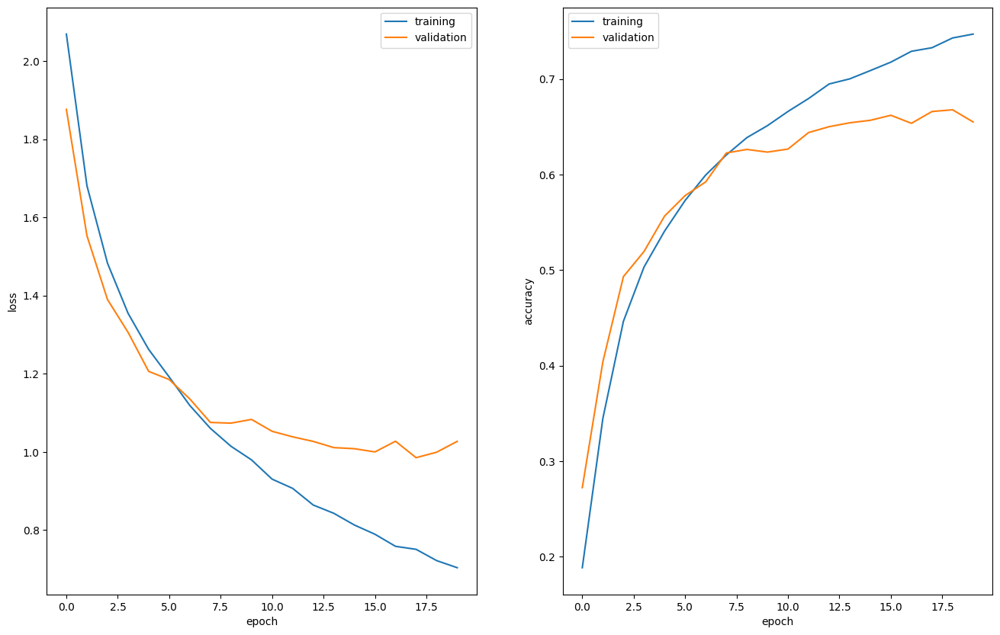

In [ ]:
h = history_2.history
plt.figure(1, figsize=(16, 10))

plt.subplot(121)
plt.xlabel('epoch')
plt.ylabel('loss')
plt.plot(h['loss'], label='training')
plt.plot(h['val_loss'], label='validation')
plt.legend()

plt.subplot(122)
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.plot(h['accuracy'], label='training')
plt.plot(h['val_accuracy'], label='validation')
plt.legend()

plt.show()

In [ ]:
# result = model2.evaluate(norm_x_test,norm_y_test,batch_size=128)

79/79 [==============================] - 1s 11ms/step - loss: 1.0464 - accuracy: 0.6536 - categorical_accuracy: 0.6536


# Add Early Stopping with patience and Batch Normalization
Increasing the number of epochs to 100 and adding patience of 4 to the early stopping callback.
* Around 70% validation accuracy.
* The model stopped after the 10th epoch to prevent overfitting on the training data.


In [ ]:
from keras.layers import BatchNormalization
from keras.callbacks import EarlyStopping

In [ ]:
model3 = Sequential([

  Conv2D(filters=8 , kernel_size=(4,4),input_shape=input_shape,activation="relu",padding='same'),
  Conv2D(filters=16 , kernel_size=(4,4),activation="relu",padding='same'),
  Conv2D(filters=32 , kernel_size=(4,4),activation="relu",padding='same'),
  BatchNormalization(),
  Dropout(0.3),
  MaxPooling2D(pool_size=(2,2)),


  Conv2D(filters=64 , kernel_size=(4,4),activation="relu",padding='same'),
  Conv2D(filters=128 , kernel_size=(4,4),activation="relu",padding='same'),
  Dropout(0.3),
  Conv2D(filters=256 , kernel_size=(4,4),activation="relu",padding='same'),
  BatchNormalization(),
  MaxPooling2D(pool_size=(2,2)),

  Flatten(),
  Dense(256,activation='relu'),
  Dense(128,activation='relu'),
  Dense(64,activation='relu'),
  Dense(10,activation='softmax'),
])

model3.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 8)         392       
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 16)        2064      
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 32)        8224      
                                                                 
 batch_normalization (Batch  (None, 32, 32, 32)        128       
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 32, 32, 32)        0         
                                                                 
 max_pooling2d (MaxPooling2  (None, 16, 16, 32)        0         
 D)                                                     

In [ ]:
opt3 = Adam()
callback = EarlyStopping(monitor='val_loss',patience=4)
model3.compile(loss='categorical_crossentropy',optimizer=opt3, metrics=['accuracy','categorical_accuracy'])
history_3 = model3.fit(play_xtrain,play_Y_train,batch_size=128,epochs=100,validation_split=0.3,callbacks=[callback])

Epoch 1/100
274/274 [==============================] - 66s 233ms/step - loss: 1.8198 - accuracy: 0.3724 - categorical_accuracy: 0.3724 - val_loss: 3.2090 - val_accuracy: 0.1891 - val_categorical_accuracy: 0.1891
Epoch 2/100
274/274 [==============================] - 61s 224ms/step - loss: 1.2354 - accuracy: 0.5584 - categorical_accuracy: 0.5584 - val_loss: 2.2198 - val_accuracy: 0.3388 - val_categorical_accuracy: 0.3388
Epoch 3/100
274/274 [==============================] - 63s 228ms/step - loss: 0.9817 - accuracy: 0.6529 - categorical_accuracy: 0.6529 - val_loss: 1.0995 - val_accuracy: 0.6247 - val_categorical_accuracy: 0.6247
Epoch 4/100
274/274 [==============================] - 62s 225ms/step - loss: 0.8146 - accuracy: 0.7121 - categorical_accuracy: 0.7121 - val_loss: 1.1735 - val_accuracy: 0.6150 - val_categorical_accuracy: 0.6150
Epoch 5/100
274/274 [==============================] - 62s 225ms/step - loss: 0.6884 - accuracy: 0.7570 - categorical_accuracy: 0.7570 - val_loss: 1.364

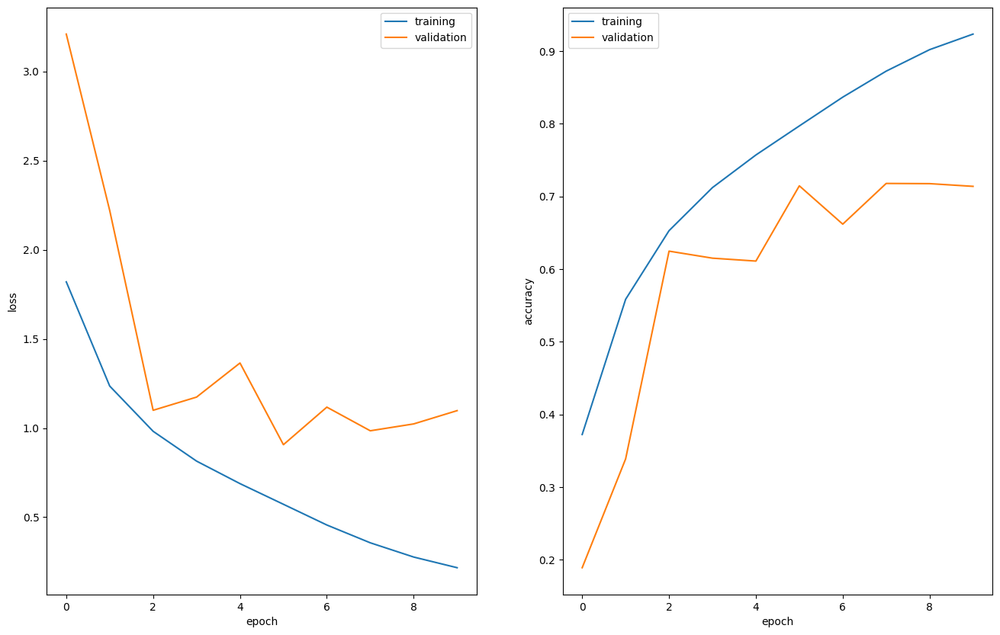

In [ ]:
h = history_3.history
plt.figure(1, figsize=(16, 10))

plt.subplot(121)
plt.xlabel('epoch')
plt.ylabel('loss')
plt.plot(h['loss'], label='training')
plt.plot(h['val_loss'], label='validation')
plt.legend()

plt.subplot(122)
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.plot(h['accuracy'], label='training')
plt.plot(h['val_accuracy'], label='validation')
plt.legend()

plt.show()

In [ ]:
result = model3.evaluate(norm_x_test,norm_y_test,batch_size=128)

79/79 [==============================] - 4s 44ms/step - loss: 1.1240 - accuracy: 0.7050 - categorical_accuracy: 0.7050


# Add Snapshot ensambling
Paper: https://arxiv.org/pdf/1704.00109v1
Tutorial : https://www.kaggle.com/code/fkdplc/snapshot-ensemble-tutorial-with-keras

* I trained 5 models for 50 epochs (1 model per 10 epochs ) and saved snapshots for each model ( model parameters ).
* Validation accuracy differs from each model to the other but on average 70% accuracy.
* On testset it evaluates to 72%
* Maybe regularisation and increasing the number of epochs per model for can help optimise the results but I got caught by time.



In [ ]:
from keras.callbacks import Callback
from keras import backend
from keras.models import load_model
import math

# this callback applies cosine annealing, saves snapshots and allows to load them
class SnapshotEnsemble(Callback):

    __snapshot_name_fmt = "snapshot_%d.hdf5"

    def __init__(self, n_models, n_epochs_per_model, lr_max, verbose=1):
        """
        n_models -- quantity of models (snapshots)
        n_epochs_per_model -- quantity of epoch for every model (snapshot)
        lr_max -- maximum learning rate (snapshot starter)
        """
        self.n_epochs_per_model = n_epochs_per_model
        self.n_models = n_models
        self.n_epochs_total = self.n_models * self.n_epochs_per_model
        self.lr_max = lr_max
        self.verbose = verbose
        self.lrs = []

    # calculate learning rate for epoch
    def cosine_annealing(self, epoch):
        cos_inner = (math.pi * (epoch % self.n_epochs_per_model)) / self.n_epochs_per_model
        return self.lr_max / 2 * (math.cos(cos_inner) + 1)

    # when epoch begins update learning rate
    def on_epoch_begin(self, epoch, logs={}):
        # update learning rate
        lr = self.cosine_annealing(epoch)
        backend.set_value(self.model.optimizer.lr, lr)
        # log value
        self.lrs.append(lr)

    # when epoch ends check if there is a need to save a snapshot
    def on_epoch_end(self, epoch, logs={}):
        if (epoch + 1) % self.n_epochs_per_model == 0:
            # save model to file
            filename = self.__snapshot_name_fmt % ((epoch + 1) // self.n_epochs_per_model)
            self.model.save(filename)
            if self.verbose:
                print('Epoch %d: snapshot saved to %s' % (epoch, filename))

    # load all snapshots after training
    def load_ensemble(self):
        models = []
        for i in range(self.n_models):
            models.append(load_model(self.__snapshot_name_fmt % (i + 1)))
        return models

In [ ]:
model4 = Sequential([

  Conv2D(filters=8 , kernel_size=(4,4),input_shape=input_shape,activation="relu",padding='same'),
  Dropout(0.3),

  Conv2D(filters=16 , kernel_size=(4,4),activation="relu",padding='same'),
  Dropout(0.3),


  Conv2D(filters=32 , kernel_size=(4,4),activation="relu",padding='same'),
  BatchNormalization(),
  MaxPooling2D(pool_size=(2,2)),




  Conv2D(filters=64 , kernel_size=(4,4),activation="relu",padding='same'),
  Dropout(0.3),


  Conv2D(filters=128 , kernel_size=(4,4),activation="relu",padding='same'),
  Dropout(0.3),


  Conv2D(filters=256 , kernel_size=(4,4),activation="relu",padding='same'),
  BatchNormalization(),
  MaxPooling2D(pool_size=(2,2)),


  Flatten(),
  Dense(256,activation='relu'),
  Dense(128,activation='relu'),
  Dense(64,activation='relu'),
  Dense(10,activation='softmax'),
])

model4.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_188 (Conv2D)         (None, 32, 32, 8)         392       
                                                                 
 dropout (Dropout)           (None, 32, 32, 8)         0         
                                                                 
 conv2d_189 (Conv2D)         (None, 32, 32, 16)        2064      
                                                                 
 dropout_1 (Dropout)         (None, 32, 32, 16)        0         
                                                                 
 conv2d_190 (Conv2D)         (None, 32, 32, 32)        8224      
                                                                 
 batch_normalization_188 (B  (None, 32, 32, 32)        128       
 atchNormalization)                                              
                                                        

In [ ]:
opt4 = Adam()
# early_stopping = EarlyStopping(monitor='val_loss',patience=10)
snapshot_ensembling = SnapshotEnsemble(n_models=10, n_epochs_per_model=10, lr_max=.001)

model4.compile(loss='categorical_crossentropy',optimizer=opt4, metrics=['accuracy','categorical_accuracy'])
history_4 = model4.fit(play_xtrain,play_Y_train,batch_size=128,epochs=100,validation_split=0.3,callbacks=[snapshot_ensembling])

Epoch 1/100
175/274 [==================>...........] - ETA: 21s - loss: 2.3318 - accuracy: 0.2523 - categorical_accuracy: 0.2523

KeyboardInterrupt: 

In [ ]:
result4 = model4.evaluate(norm_x_test,norm_y_test,batch_size=128)

79/79 [==============================] - 1s 11ms/step - loss: 1.2080 - accuracy: 0.6865 - categorical_accuracy: 0.6865


# Problem 2
I focused on the main three factors, operations, total accuracy and number of parameters. Therefore, I chose inception V3.
I also considered choosing Inception V4 but I was not convinced that to achieve just a little higher accuracy, we need more operations and more parameters.


# Inception V3


* Inception V3 received 256*256 pixels so i had to resize my dataset (32*32 pixels) using bilinear interpolation (take the average of the closest 4 pixels)
* I removed the Inception V3 model classifier and froze its feature extraction weights and added my classifier on top.
* Around 83% validation accuracy.
* On testset it evaluates to 83% also which is 10% better than my best model.






In [ ]:
from keras.applications import InceptionV3

In [ ]:
resizing = keras.layers.Resizing(256,256)
play_xtrain2 = resizing(play_xtrain)

In [ ]:
base_model = InceptionV3(include_top=False,weights='imagenet',input_shape=(256,256,3))

87910968/87910968 [==============================] - 0s 0us/step


In [ ]:
base_model.trainable = False

In [ ]:
inputs = keras.Input(shape=(256,256,3))
x = base_model(inputs,training=False)
x = GlobalAveragePooling2D()(x)
x = Dense(1024,activation='relu')(x)
x = Dense(512,activation='relu')(x)
x = Dense(256,activation='relu')(x)
outputs = Dense(10,activation='softmax')(x)
model5 = keras.Model(inputs,outputs)

In [ ]:
model5.compile(optimizer=Adam(),loss='categorical_crossentropy',metrics=['accuracy','categorical_accuracy'])
history5 = model5.fit(x=play_xtrain2,y=play_Y_train,batch_size=128,epochs=10,validation_split=0.3)

Epoch 1/10
274/274 [==============================] - 368s 1s/step - loss: 0.6752 - accuracy: 0.7702 - categorical_accuracy: 0.7702 - val_loss: 0.5493 - val_accuracy: 0.8104 - val_categorical_accuracy: 0.8104
Epoch 2/10
274/274 [==============================] - 366s 1s/step - loss: 0.4924 - accuracy: 0.8289 - categorical_accuracy: 0.8289 - val_loss: 0.5160 - val_accuracy: 0.8195 - val_categorical_accuracy: 0.8195
Epoch 3/10
274/274 [==============================] - 365s 1s/step - loss: 0.4391 - accuracy: 0.8466 - categorical_accuracy: 0.8466 - val_loss: 0.5167 - val_accuracy: 0.8223 - val_categorical_accuracy: 0.8223
Epoch 4/10
274/274 [==============================] - 369s 1s/step - loss: 0.3916 - accuracy: 0.8626 - categorical_accuracy: 0.8626 - val_loss: 0.4784 - val_accuracy: 0.8354 - val_categorical_accuracy: 0.8354
Epoch 5/10
274/274 [==============================] - ETA: 0s - loss: 0.3577 - accuracy: 0.8734 - categorical_accuracy: 0.8734

In [ ]:
model5.summary()

In [ ]:
h = history5.history
plt.figure(1, figsize=(16, 10))

plt.subplot(121)
plt.xlabel('epoch')
plt.ylabel('loss')
plt.plot(h['loss'], label='training')
plt.plot(h['val_loss'], label='validation')
plt.legend()

plt.subplot(122)
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.plot(h['accuracy'], label='training')
plt.plot(h['val_accuracy'], label='validation')
plt.legend()

plt.show()

# Problem 3
* I made a function which receives the test image along with the dimensions of the occluder and slides it over the image.
* The function returns a list of images which are predicted by a pre-trained ResNet V2 model.
* I resized the test images so they can fit the model input layer with the same concept as in problem 2.
* Then I looped through the images and got predictions for each class.
* After that, I got only the probabilities of the correct class (toy terrier) from the predictions list.
* Below is a sample of the occluder sliding through the image with the prediction probability of the correct class “toy terrier”.
* It is obvious that when we occlude the dog’s face, the probability for the correct class reduces significantly.
* I created the below map to show the positions of the occluder with the probability of the model to classify the image correctly at that position.  



In [ ]:
res = requests.get('https://raw.githubusercontent.com/EliSchwartz/imagenet-sample-images/master/n02087046_toy_terrier.JPEG', stream = True)

if res.status_code == 200:
    with open('toy_terrier.JPEG','wb') as f:
        shutil.copyfileobj(res.raw, f)
    print('Image sucessfully Downloaded: ','toy_terrier.JPEG')
else:
    print('Image Couldn\'t be retrieved')

Image sucessfully Downloaded:  toy_terrier.JPEG


In [ ]:
import requests
test_img = tf.io.read_file('/content/toy_terrier.JPEG')
decoded_img = tf.io.decode_image(test_img,channels=3)
resized_img = tf.image.resize(decoded_img,[299,299])
input_img = tf.expand_dims(resized_img, axis=0)

In [ ]:
def rec(image,width,height,padding_col,padding_row):
  img = image
  for i in range(img.shape[1]):
    if i >= padding_col :
      if i > padding_col+width:
        continue
      else :
        for j in range(img.shape[2]):
          if j >= padding_row:
            if j > height + padding_row:
              continue
            else:
              img[0][i][j] = 125
  return img


In [ ]:
test_imgs = []
test_imgs2 = []
for i in range(0,6):
  for j in range(0,6):
    test_img = tf.io.read_file('/content/toy_terrier.JPEG')
    decoded_img = tf.io.decode_image(test_img,channels=3)
    resized_img = tf.image.resize(decoded_img,[299,299])
    input_img = tf.expand_dims(resized_img, axis=0)
    test_imgs.append(rec(input_img.numpy(),50,50,i*50,j*50))
    test_imgs2.append(rec(input_img.numpy(),50,50,i*50,j*50))





In [ ]:
preds_list = []
final_list = []
for i in test_imgs:
  x = keras.applications.resnet_v2.preprocess_input(i)
  preds = model.predict(x)
  preds_list.append(preds)
  final_list.append(keras.applications.imagenet_utils.decode_predictions(preds,top=1000))


1/1 [==============================] - 0s 71ms/step


In [ ]:
correct_class_probs = []
for i in final_list:
  for j,names,probs in i[0]:
    if names == "toy_terrier":
      correct_class_probs.append(probs)

In [ ]:
correct_class_probs

[0.8993103,
 0.9103694,
 0.8092176,
 0.79364765,
 0.90118164,
 0.9252908,
 0.9080065,
 0.9208397,
 0.24055506,
 0.13135523,
 0.8664612,
 0.92434496,
 0.9230891,
 0.9347873,
 0.8549759,
 0.012794491,
 0.91223395,
 0.8952868,
 0.90662545,
 0.93128175,
 0.9280377,
 0.93431926,
 0.88813525,
 0.87550586,
 0.90628135,
 0.8928987,
 0.88895595,
 0.89264345,
 0.8645756,
 0.89339525,
 0.90084064,
 0.8999066,
 0.9052356,
 0.8977861,
 0.900048,
 0.90626657]

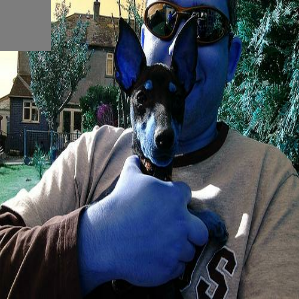

0.8993103


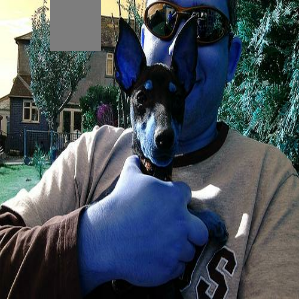

0.9103694


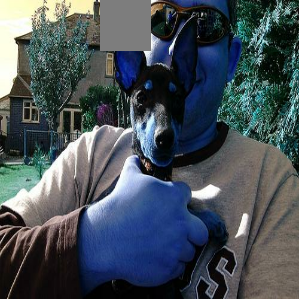

0.8092176


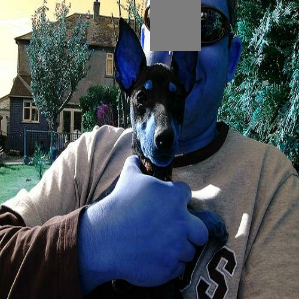

0.79364765


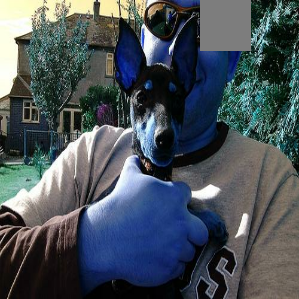

0.90118164


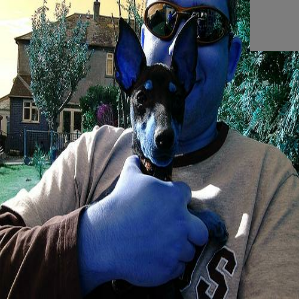

0.9252908


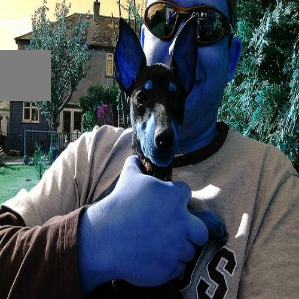

0.9080065


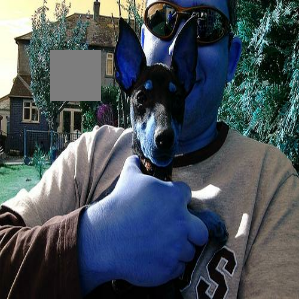

0.9208397


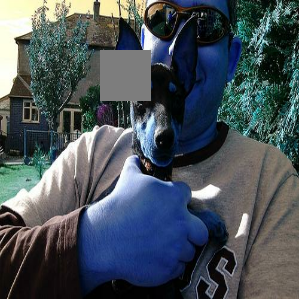

0.24055506


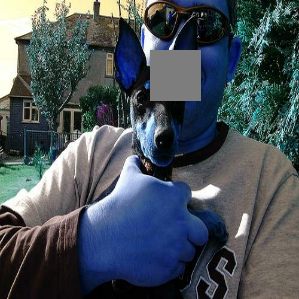

0.13135523


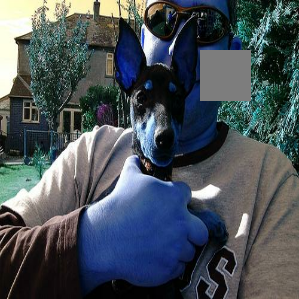

0.8664612


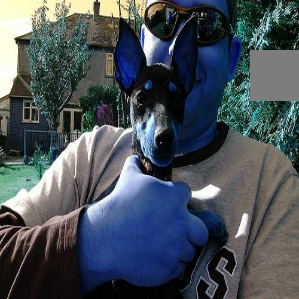

0.92434496


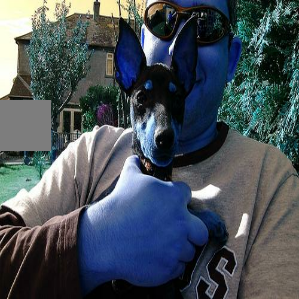

0.9230891


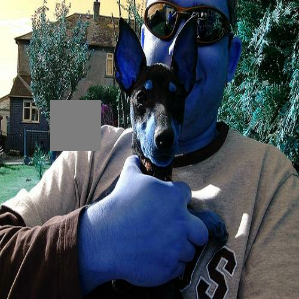

0.9347873


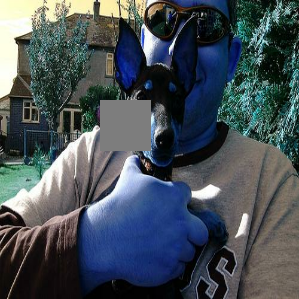

0.8549759


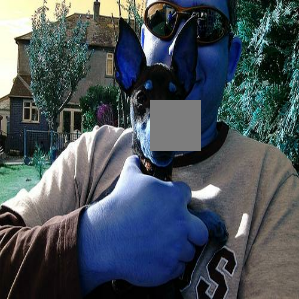

0.012794491


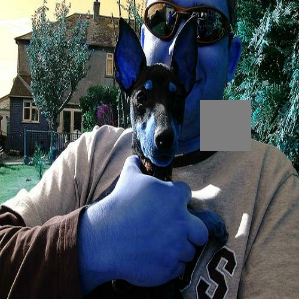

0.91223395


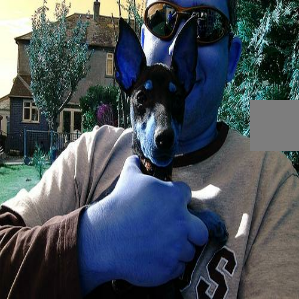

0.8952868


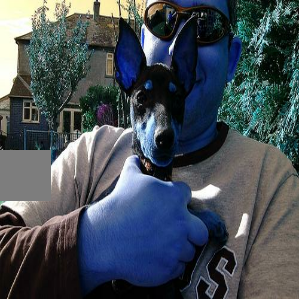

0.90662545


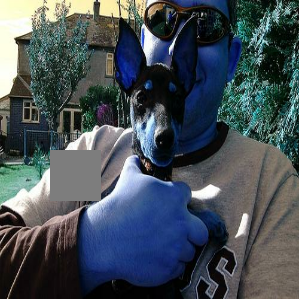

0.93128175


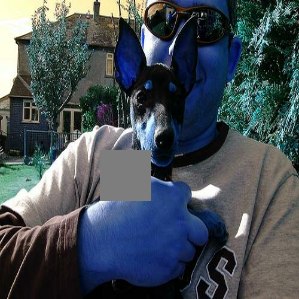

0.9280377


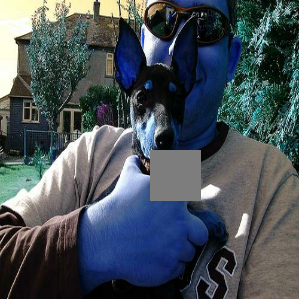

0.93431926


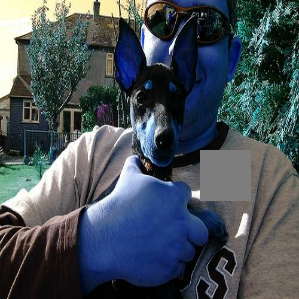

0.88813525


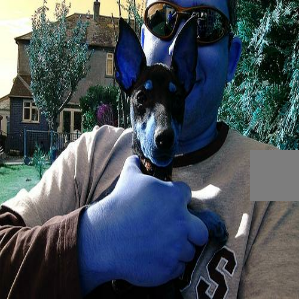

0.87550586


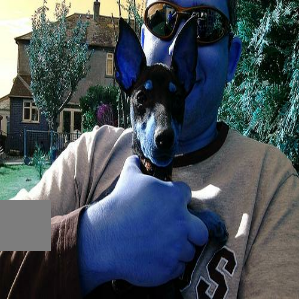

0.90628135


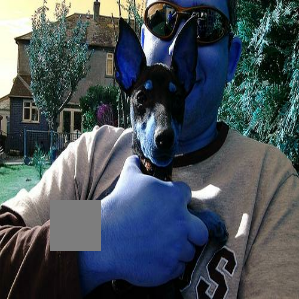

0.8928987


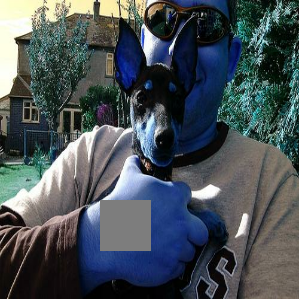

0.88895595


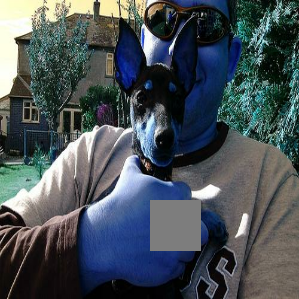

0.89264345


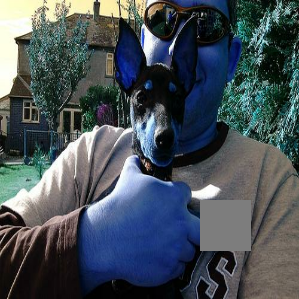

0.8645756


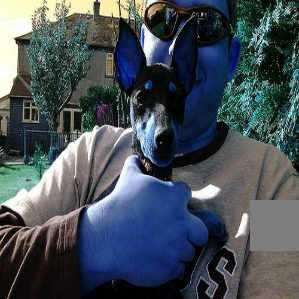

0.89339525


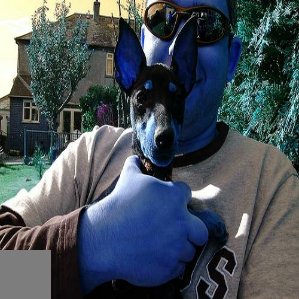

0.90084064


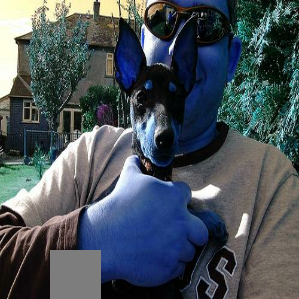

0.8999066


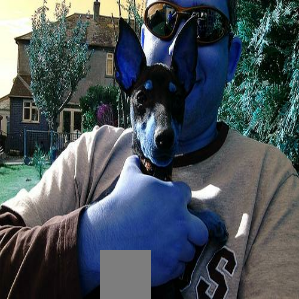

0.9052356


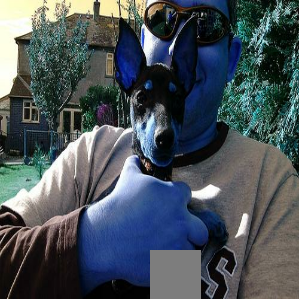

0.8977861


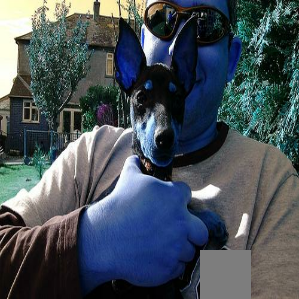

0.900048


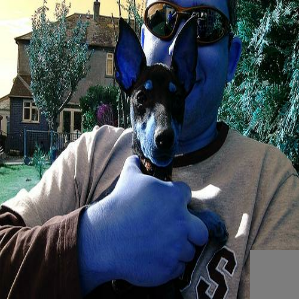

0.90626657


In [ ]:
for i in range(len(preds_list)):
  cv2_imshow(test_imgs2[i][0])
  print(correct_class_probs[i])

In [ ]:
# def return_index(i,correct_class):
#   return list(np.argsort(preds_list[i],axis=1)[0]).index(correct_class)

In [ ]:
# highest = []
# for i in range(len(test_imgs2)):
#   x = tf.keras.applications.inception_v3.preprocess_input(test_imgs2[i])
#   preds = model.predict(x)
#   highest.append(return_index(i,158))

# highest2 = np.reshape(highest,(-1,int(math.sqrt(len(highest)))))

In [ ]:
map = np.reshape(correct_class_probs,(-1,int(math.sqrt(len(correct_class_probs)))))

<Axes: >

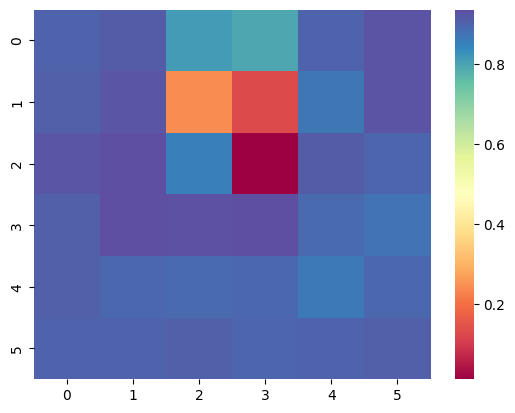

In [ ]:
sns.heatmap(map,cmap="Spectral")